# Dog vs Cat classifier with Inception

## Imports

In [1]:
# General imports
import numpy as np ; np.random.seed(1) # for reproducibility
import os
import zipfile
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random
import shutil
from datetime import datetime
import platform
%matplotlib inline

# TensorFlow
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.preprocessing.image import img_to_array, load_img
from keras.preprocessing import image
from tensorflow.keras import Model
from tensorflow.keras.applications.inception_v3 import InceptionV3
from PIL import Image

## TensorFlow information

In [2]:
# Indicate the version of Tensorflow and whether it uses the CPU or the GPU
print("TensorFlow version:", tf.__version__)

if len(tf.config.list_physical_devices('GPU')) > 0:
    print("The GPU will be used for calculations.")
    
else:
    print("The CPU will be used for calculations.")

TensorFlow version: 2.4.0
The CPU will be used for calculations.


## Import data 

In [12]:
# Define OS
os_machine = 'macOS' # Windows | macOS | Linux
print('We are on', os_machine)

# Select if the data is downloaded for the first time (or refreshed)
refresh_data = False

if refresh_data:

    # Import dataset
    if os_machine == 'macOS' or os_machine == 'Linux':
        !wget --no-check-certificate \
            https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip \
            -O ./Data/cats_and_dogs_filtered.zip
    elif os_machine == 'Windows':
        !curl.exe --output "./Data/cats_and_dogs_filtered.zip" --url \
        "https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip"

    # Unzip
    local_zip = './data/cats_and_dogs_filtered.zip'
    zip_ref = zipfile.ZipFile(local_zip, 'r')
    zip_ref.extractall('./data/')
    zip_ref.close()

We are on macOS


### Prepare folders

In [4]:
# Define directories
base_dir = './Data/cats_and_dogs_filtered'
train_dir = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'validation')

# Directory with training pictures
train_cats_dir = os.path.join(train_dir, 'cats')
train_dogs_dir = os.path.join(train_dir, 'dogs')

# Directory with pictures
validation_cats_dir = os.path.join(validation_dir, 'cats')
validation_dogs_dir = os.path.join(validation_dir, 'dogs')

### Download Inception pre-trained model

In [5]:
if refresh_data:

    # Download pre-trained model
    if os_machine == 'macOS' or os_machine == 'Linux':
        !wget --no-check-certificate \
            https://storage.googleapis.com/mledu-datasets/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5 \
            -O ./Data/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5
    elif os_machine == 'Windows':
        !curl.exe --output "./Data/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5" \
        --url "https://storage.googleapis.com/mledu-datasets/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5"

# Set path to pre-trained weights
local_weights_file = './Data/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5'

## Describe data

In [6]:
# Describe data size
print('Total training cat images:', len(os.listdir(train_cats_dir)))
print('Total training dog images:', len(os.listdir(train_dogs_dir)))
print('Total validation cat images:', len(os.listdir(validation_cats_dir)))
print('Total validation dog images:', len(os.listdir(validation_dogs_dir)))

Total training cat images: 1000
Total training dog images: 1000
Total validation cat images: 500
Total validation dog images: 500


In [7]:
# Get names of pictures
train_cat_fnames = os.listdir(train_cats_dir)
train_dog_fnames = os.listdir(train_dogs_dir)
validation_cat_fnames = os.listdir(validation_cats_dir)
validation_dog_fnames = os.listdir(validation_dogs_dir)

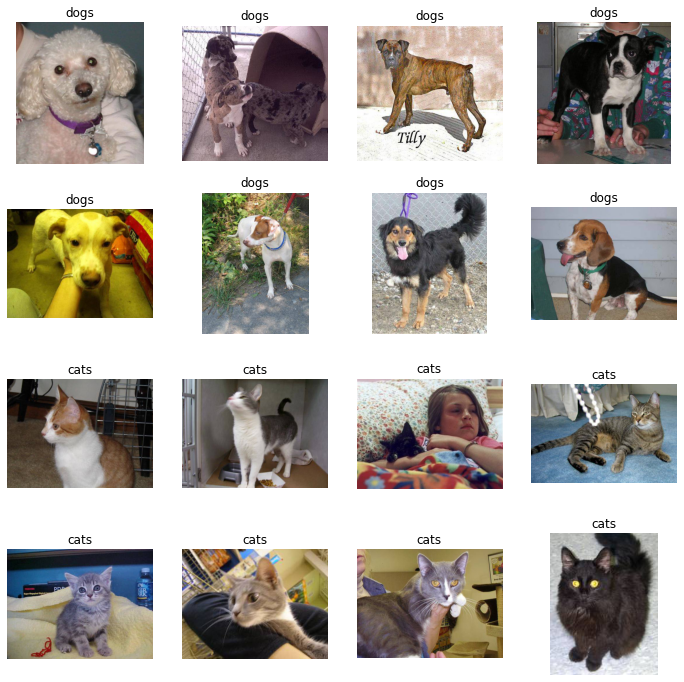

In [17]:
# Number of pictures in the grid
nrows = 4
ncols = 4

# Set up matplotlib fig
longitude_image = 3 # Inches per picture
fig = plt.gcf()
fig.set_size_inches(ncols * longitude_image, nrows * longitude_image)

# Number of pictures to use for each class
pic_index = 8
next_dog_pix = [os.path.join(train_dogs_dir, fname) 
                for fname in train_dog_fnames[pic_index-8:pic_index]]
next_cat_pix = [os.path.join(train_cats_dir, fname) 
                for fname in train_cat_fnames[pic_index-8:pic_index]]

# Get each image
for i, img_path in enumerate(next_dog_pix+next_cat_pix):
    if os_machine == 'Windows':
        picture_name = img_path.split("\\")[2:4]
    else:
        picture_name = img_path.split("/")[4]
    sp = plt.subplot(nrows, ncols, i + 1)
    sp.axis('Off') # Don't show axes (or gridlines)
    img = mpimg.imread(img_path)
    plt.imshow(img)
    plt.title(picture_name)

# Plot grid
plt.show()

## 3. Data Preprocessing

### Normalization and Data Augmentation

In [18]:
# Set seed for random functions
tf.random.set_seed(1)

# Define batch size
train_batch = 32
validation_batch = 32

# Data augmentation for the training set
train_datagen = ImageDataGenerator(
    rescale=1./255,            
    rotation_range=40,         
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Generate batches of augmented data for the training set
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(150, 150),    # Images will be resized to 150x150
    batch_size=train_batch,    # Batch size
    class_mode='binary'        # When using binary_crossentropy loss, we need binary labels
)

# Note that validation data should not be augmented
validation_datagen = ImageDataGenerator(rescale = 1.0/255.)

# Generate batches of augmented data for the test set
validation_generator = validation_datagen.flow_from_directory(
    validation_dir,
    target_size=(150, 150),        # Images will be resized to 150x150
    batch_size=validation_batch,   # Batch size
    class_mode='binary'            # When using binary_crossentropy loss, we need binary labels
)

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


## Convolutional NN
The "output shape" column in the summary shows how the size of your feature map evolves in each successive layer. The convolution layers reduce the size of the feature maps by a bit due to padding, and each pooling layer halves the dimensions.

### Pre-trained model

In [19]:
# Set seed for random functions
tf.random.set_seed(1)

# Define pre-trained model
pre_trained_model = InceptionV3(input_shape = (150, 150, 3), # To be specified if include_top is False
                                include_top = False,         # Do not include the fully-connected layer at the top
                                weights = None)              # None = random initialization

# Load pre-trained weights
pre_trained_model.load_weights(local_weights_file)

# Lock the layers to avoid training them
for layer in pre_trained_model.layers:
    layer.trainable = False

# Print summary
pre_trained_model.summary()


Model: "inception_v3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 150, 150, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 74, 74, 32)   864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 74, 74, 32)   96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 74, 74, 32)   0           batch_normalization[0][0]        
_______________________________________________________________________________________

In [20]:
# Use the name of last convolution layer desired (e.g., the one that convolved to 7 by 7)
last_layer = pre_trained_model.get_layer('mixed7')
print('Last layer output shape:', last_layer.output_shape)
last_output = last_layer.output

Last layer output shape: (None, 7, 7, 768)


### Custom model

In [21]:
# Flatten the desired output layer from the pre-trained model
x = layers.Flatten()(last_output)
# Add a fully connected layer with 1,024 hidden units and ReLU activation
x = layers.Dense(1024, activation='relu')(x)
# Add a dropout rate of 0.2
x = layers.Dropout(0.2)(x)                  
# Add a final sigmoid layer for classification
x = layers.Dense(1, activation='sigmoid')(x)           

# Build model
model = Model(pre_trained_model.input, x) 

In [22]:
# Compile model
model.compile(
    optimizer=RMSprop(lr=1e-4), 
    loss='binary_crossentropy', 
    metrics=['accuracy']
)

## Train

In [23]:
# Get length of each dataset
train_length = len(train_generator.filepaths)
validation_length = len(validation_generator.filepaths)

In [24]:
# Fit the model
history = model.fit(
    train_generator,
    steps_per_epoch=train_length//train_batch,  
    epochs=3,
    verbose=1,
    validation_data=validation_generator,
    validation_steps=validation_length//validation_batch
)

Epoch 1/3
62/62 [==============================] - 37s 568ms/step - loss: 0.6107 - accuracy: 0.8113 - val_loss: 0.1095 - val_accuracy: 0.9577
Epoch 2/3
62/62 [==============================] - 35s 570ms/step - loss: 0.2468 - accuracy: 0.9072 - val_loss: 0.1016 - val_accuracy: 0.9667
Epoch 3/3
62/62 [==============================] - 35s 563ms/step - loss: 0.1950 - accuracy: 0.9212 - val_loss: 0.1023 - val_accuracy: 0.9688


## Evaluating Accuracy and Loss for the Model

Text(0.5, 0, 'Epochs')

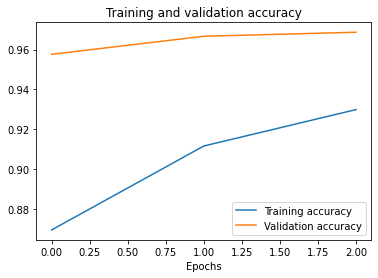

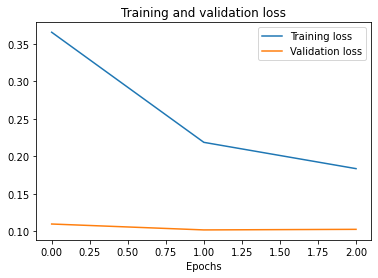

In [25]:
# Get metrics on training and test data
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

# Get number of epochs
epochs = range(len(acc)) 

# Plot training and validation accuracy per epoch
plt.plot(epochs, acc, label='Training accuracy')
plt.plot(epochs, val_acc, label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.legend(loc=0)
plt.figure()

# Plot training and validation loss per epoch
plt.plot(epochs, loss, label='Training loss')
plt.plot(epochs, val_loss, label='Validation loss')
plt.legend(loc=0)
plt.title('Training and validation loss')
plt.xlabel('Epochs')

## Use case

In [26]:
# Directory with images to test
use_case_path = './Data/Use_cases/cats-or-dogs'

# Get names of pictures
use_case_names = os.listdir(use_case_path)

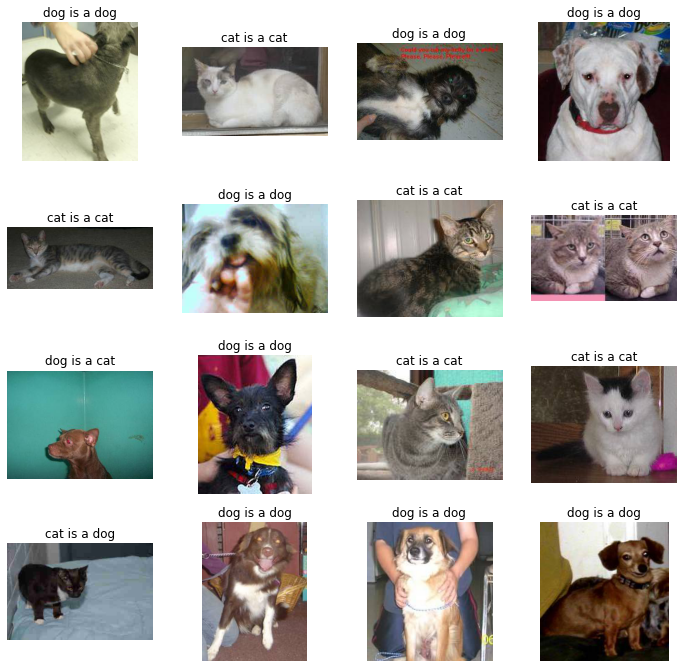

In [37]:
# Number of pictures in the grid
nrows = 8
ncols = 4

# Set up matplotlib fig
longitude_image = 3 # Inches per picture
fig = plt.gcf()
fig.set_size_inches(ncols * longitude_image, nrows * longitude_image)

# Get path to each image
next_use_case_pix = [os.path.join(use_case_path, fname) for fname in use_case_names[:]]

# Get each image
for i, img_path in enumerate(next_use_case_pix):
    # Prep-process image
    img = load_img(img_path, target_size=(150, 150))  
    x = img_to_array(img)          # Numpy array with shape (150, 150, 3)
    x = x.reshape((1,) + x.shape)  # Numpy array with shape (1, 150, 150, 3)
    x = x/255.0                    # Normalize
    # Predict
    classes = model.predict(x, batch_size=train_batch)
    if os_machine == 'Windows':
        picture_name = img_path.split("\\")[-1]
    else:
        picture_name = img_path.split("/")[-1].split(".")[0]
    if classes[0] > 0.5:
        prediction = picture_name + " is a dog"
    else:
        prediction = picture_name + " is a cat"
    # Plot image
    sp = plt.subplot(nrows, ncols, i + 1)
    sp.axis('Off') # Don't show axes (or gridlines)
    img = mpimg.imread(img_path)
    plt.imshow(img)
    plt.title(prediction)

# Plot grid
plt.show()

## Visualization of convolution

To understand what kind of *features* the convnet is learning, we can visualize how an input gets transformed as it goes through the neural network.

It goes from the raw pixels of the images to increasingly *abstract* and *compact* representations. These representations downstream start highlighting what the network pays attention to, and they show fewer and fewer features being activated; most are set to zero. This is called "*sparsity*." Representation sparsity is a key feature of deep learning.

These representations carry increasingly **less information about the original pixels** of the image, but increasingly **refined information about the class of the image**.

<ipython-input-28-e48a5de4865a>:42: RuntimeWarning: invalid value encountered in true_divide
  x /= x.std()
<ipython-input-28-e48a5de4865a>:49: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(scale * n_features, scale))


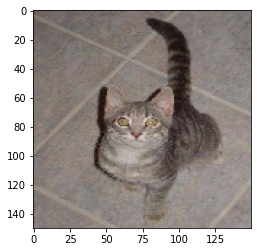

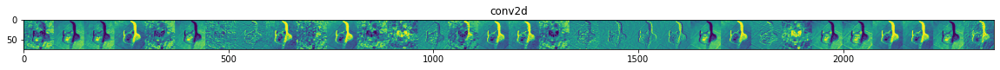

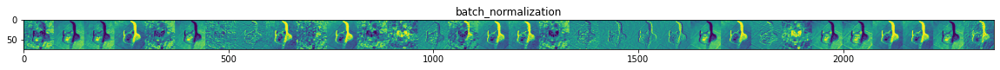

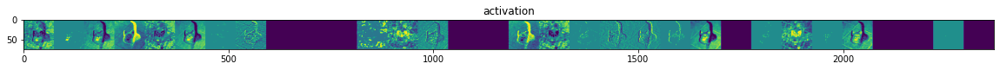

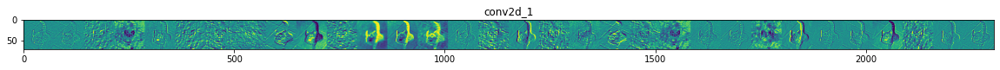

...

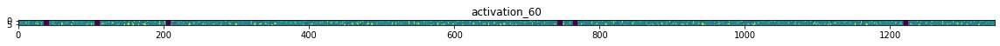

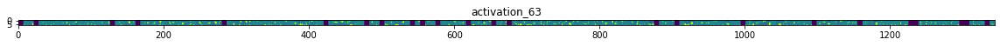

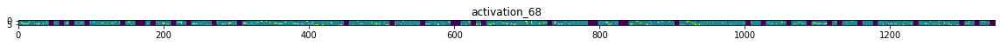

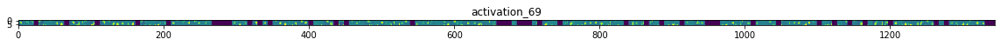

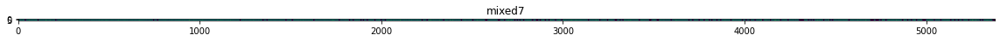

In [28]:
# Take an image and output intermediate representations for all layers 

# Take the layers
successive_outputs = [layer.output for layer in model.layers[1:]]

# Group layers into a model
visualization_model = tf.keras.models.Model(inputs = model.input, outputs = successive_outputs)

# Get a random image from the training set
dogs_img_files = [os.path.join(train_dogs_dir, f) for f in train_dog_fnames]
cats_img_files = [os.path.join(train_cats_dir, f) for f in train_cat_fnames]
img_path = random.choice(dogs_img_files + cats_img_files)

# Pre-process the image
img = load_img(img_path, target_size=(150, 150))  
plt.imshow(img)
x = img_to_array(img)          # Numpy array with shape (150, 150, 3)
x = x.reshape((1,) + x.shape)  # Numpy array with shape (1, 150, 150, 3)

# Normalize
x = x/255.0

# Run the image through the network to obtain all intermediate representations 
successive_feature_maps = visualization_model.predict(x)

# Get layer's name
layer_names = [layer.name for layer in model.layers[1:]]

# Plot the representations
for layer_name, feature_map in zip(layer_names, successive_feature_maps):
    # Just do this for the conv / maxpool layers, not the fully-connected layers
    if len(feature_map.shape) == 4:
        # Number of features in feature map
        n_features = feature_map.shape[-1]  
        # Get the feature map shape (1, size, size, n_features)
        size = feature_map.shape[1]
        # Tile the images in this matrix
        display_grid = np.zeros((size, size * n_features))
        for i in range(n_features):
            x = feature_map[0, :, :, i]
            x -= x.mean()
            x /= x.std()
            x *= 64
            x += 128
            x = np.clip(x, 0, 255).astype('uint8')
            display_grid[:, i * size : (i + 1) * size] = x
        # Display the grid
        scale = 20. / n_features
        plt.figure(figsize=(scale * n_features, scale))
        plt.title(layer_name)
        plt.grid(False)
        plt.imshow(display_grid, aspect='auto', cmap='viridis')

# Finished

In [29]:
# Print time when finished
now = datetime.now()
print("Finished! At", now.strftime("%Y-%m-%d %H:%M:%S"))

Finished! At 2021-04-24 14:08:10
